In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sep
import seaborn as sns

from astropy.io import fits
from astropy.convolution import Gaussian2DKernel, convolve_fft
from astropy.wcs import WCS
from PIL import Image

In [2]:
np.seterr(all='ignore') # too many warnings about division by 0
sns.set(style='dark')
plt.rcParams['figure.figsize'] = [12,10]

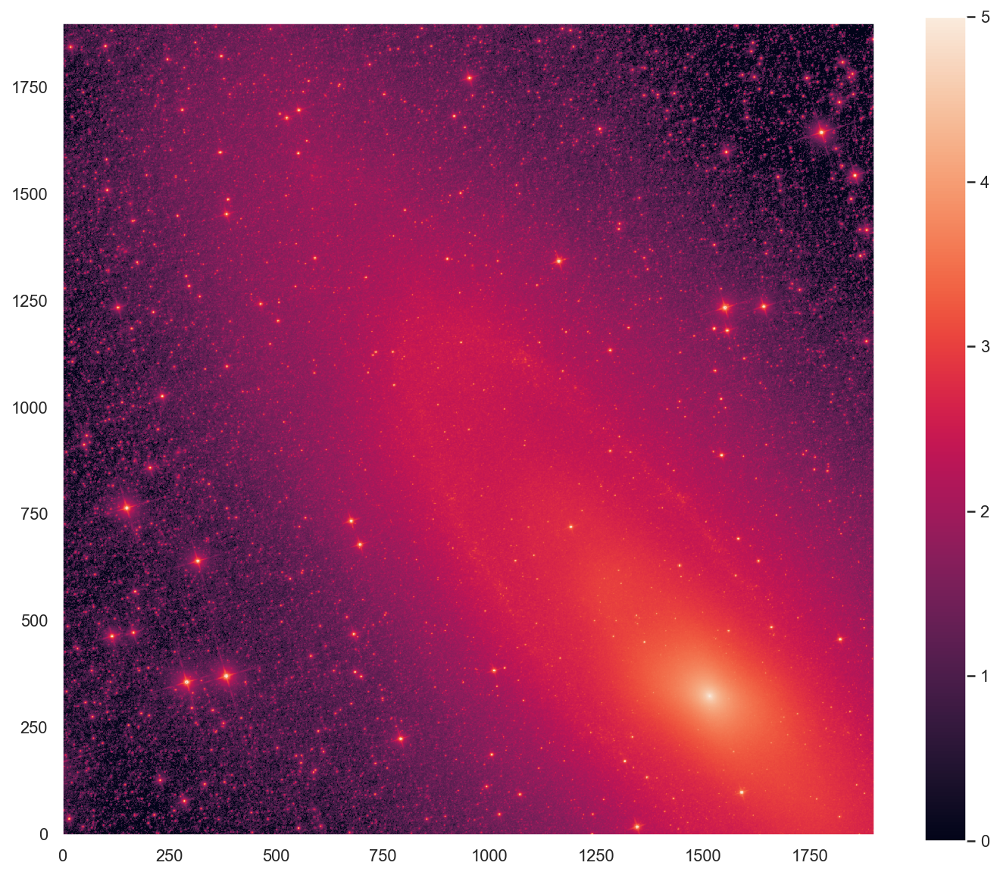

In [3]:
# select a subsection of the image that covers PHAT
# mostly this makes source extraction faster

w = h = 1900
x0, y0 = 600, 1800
x1, y1 = x0 + w, y0 + h

data_orig = fits.getdata('unwise-custom-0107p412-w1-img-m.fits').byteswap().newbyteorder()
data = data_orig[y0:y1,x0:x1].copy()
data[data <= 0] = 1
plt.imshow(np.log10(data), vmin=0, vmax=5, origin='lower')
plt.colorbar()

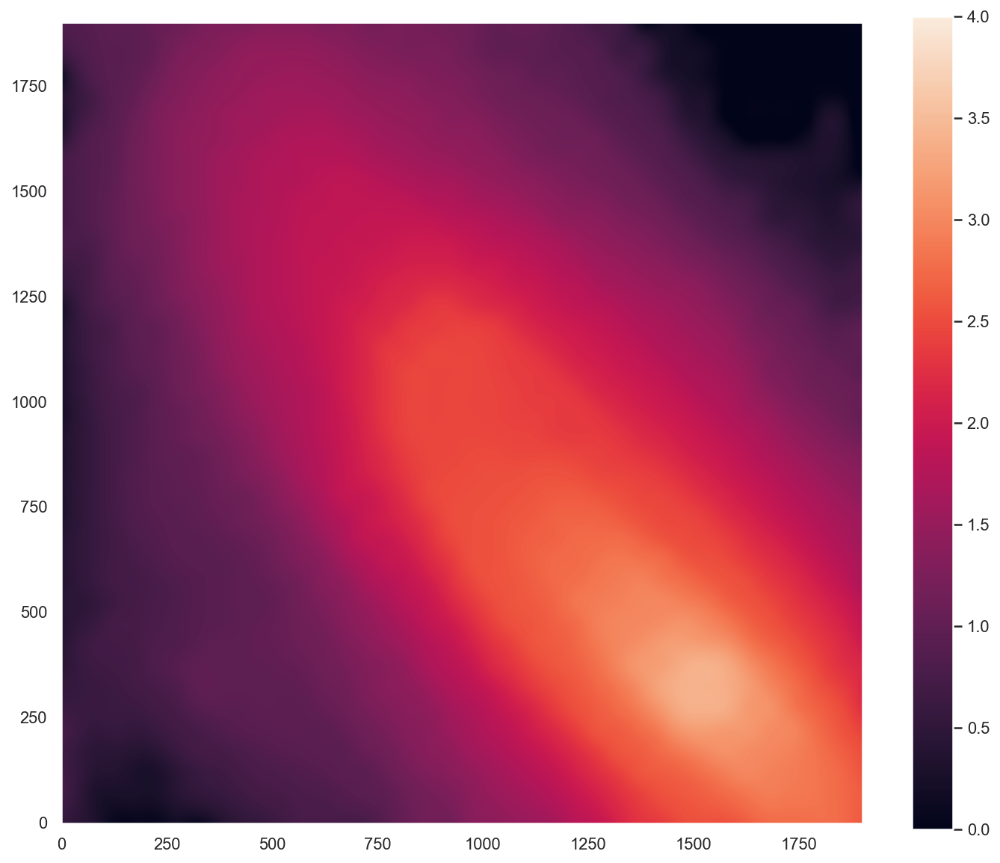

In [4]:
# get background, masking out pixels brighter than 1e4
bkg = sep.Background(data, bw=50, bh=50, fw=5, fh=5, mask=(data > 1e4))
back = bkg.back()

plt.imshow(np.log10(back), vmin=0, vmax=4, origin='lower')
plt.colorbar()

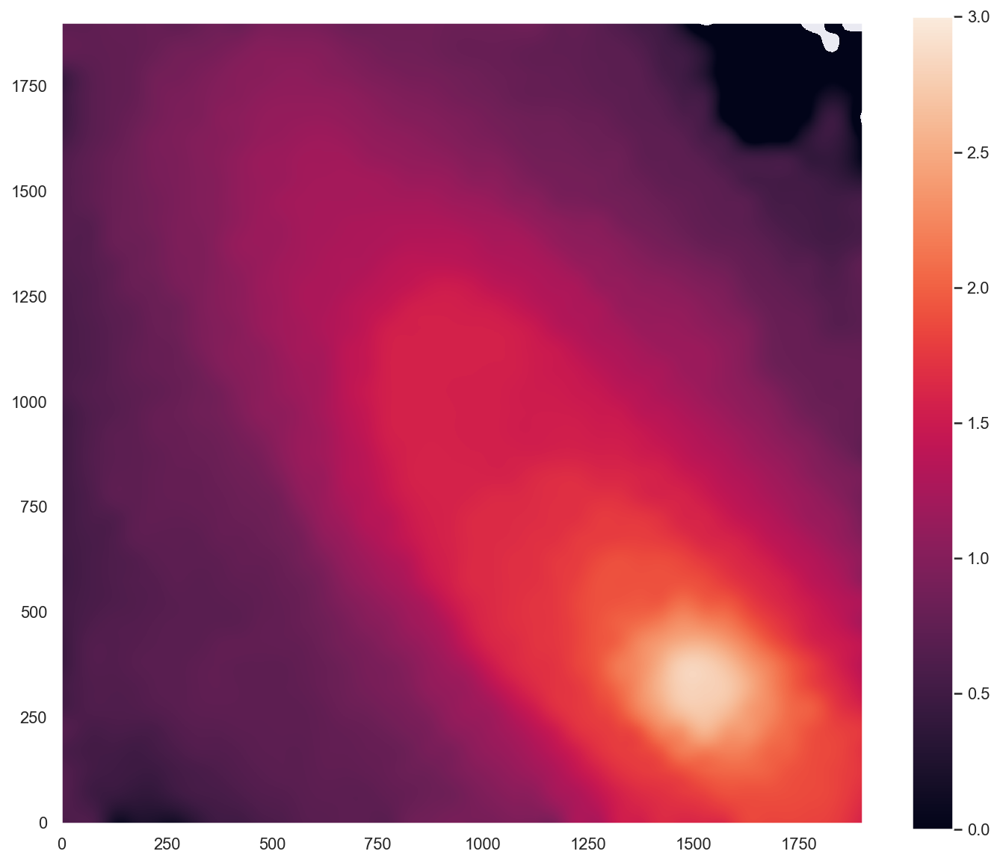

In [5]:
# show background error - sep uses this as the threshold for source extraction
rms = bkg.rms()

plt.imshow(np.log10(rms), vmin=0, vmax=3, origin='lower')
plt.colorbar()

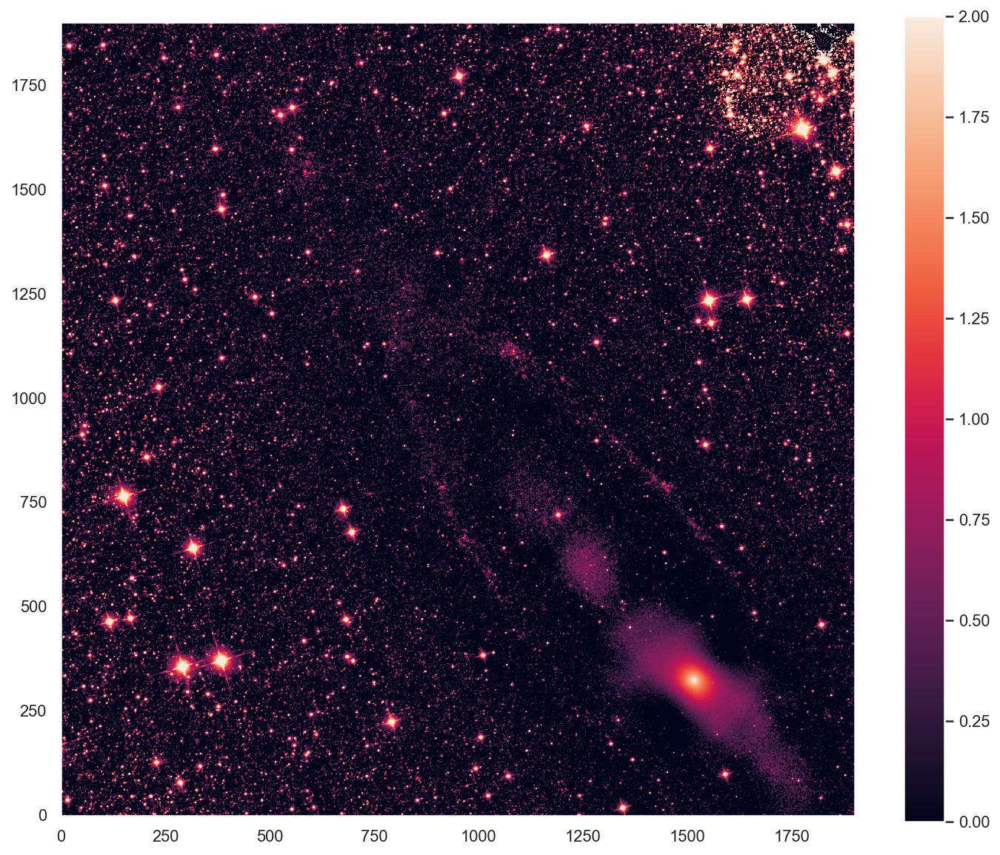

In [6]:
# subtract off background and show ratio of subtracted data to background rms
# this will give an idea of what sep will be looking at for extraction
data_sub = data - back

sigma_img = data_sub/rms
sigma_img[sigma_img < 1] = 1

plt.imshow(np.log10(sigma_img), origin='lower', vmin=0, vmax=2)
plt.colorbar()

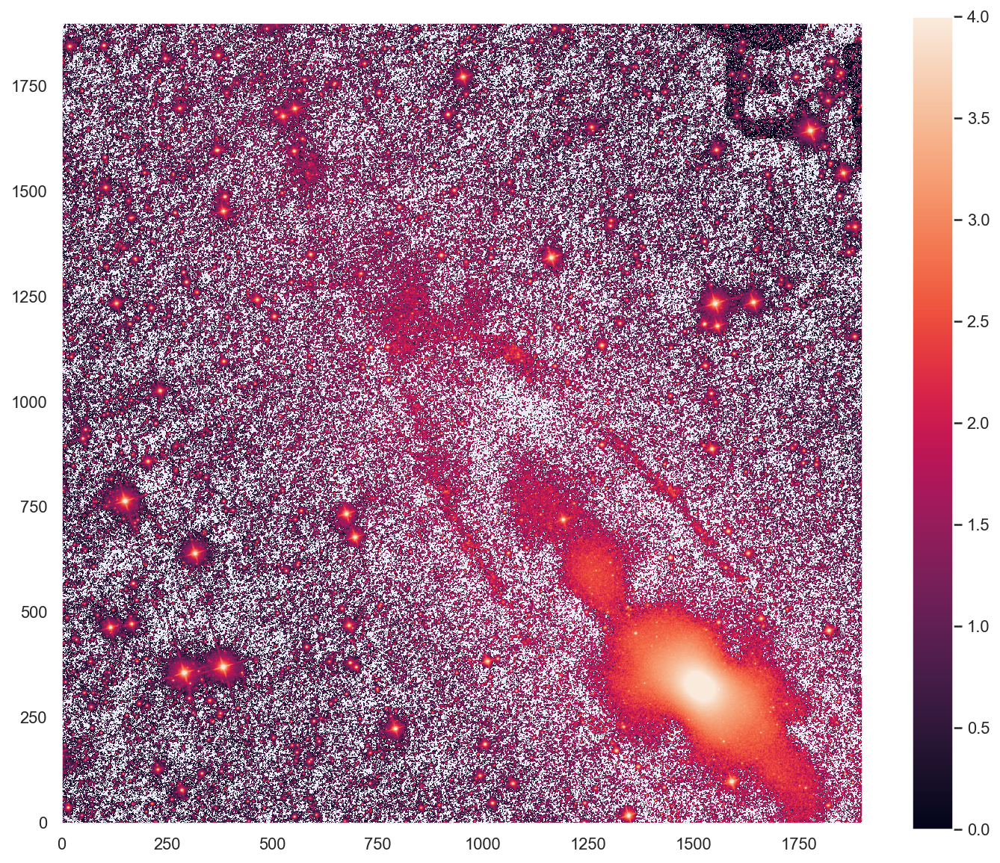

In [7]:
plt.imshow(np.log10(data_sub), origin='lower', vmin=0, vmax=4)
plt.colorbar()

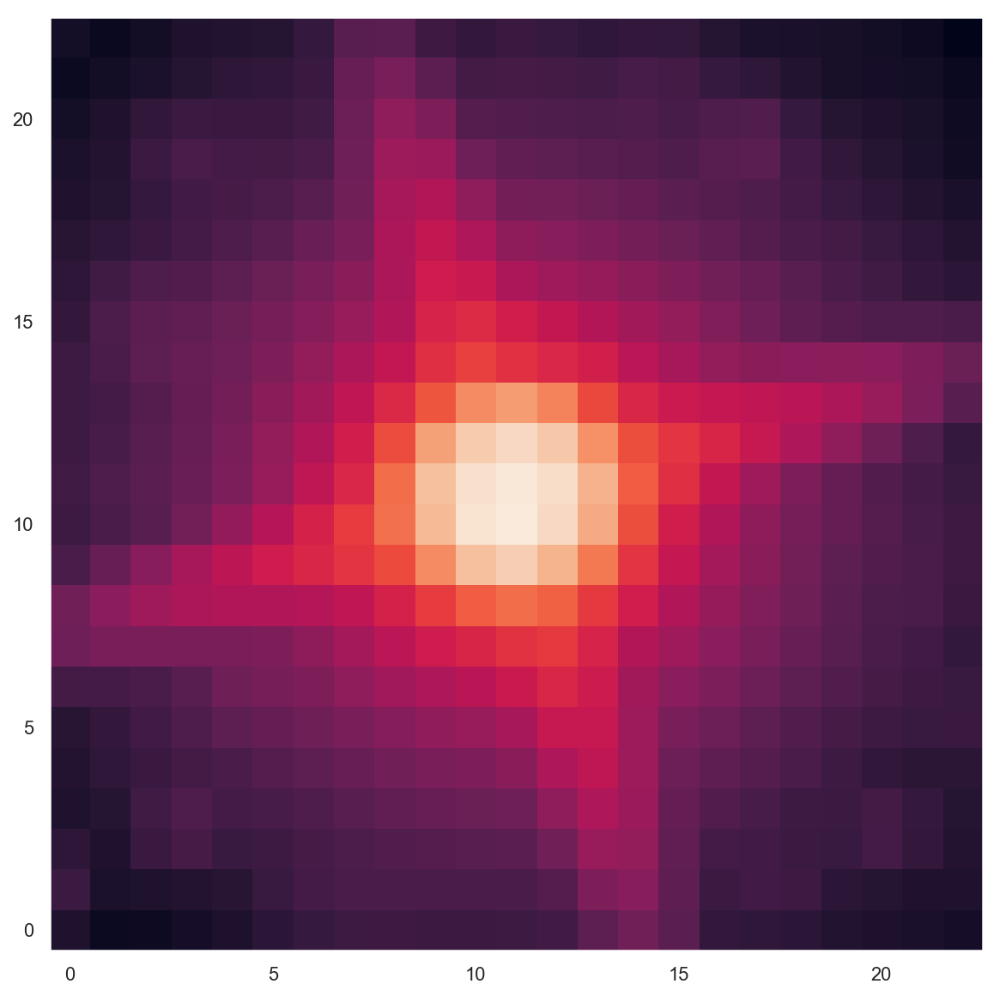

In [8]:
# make a PSF for the image to improve source extraction
# this is Extra but sep was finding a lot of nonsense with the default convolution kernel
# here i've just picked a bright star from the image, smoothed it, and downsampled it by ~2x
psf = convolve_fft(data_sub[346:398,359:410], Gaussian2DKernel(1.))
phot_kernel = np.array(Image.fromarray(psf).resize((25,25), resample=Image.LANCZOS))[1:-1,1:-1]
phot_kernel /= phot_kernel.sum()
plt.imshow(np.log10(phot_kernel), origin='lower')

In [9]:
# now we do the extraction!

# sep has some arbitrary internal max number of pixels for extraction so i'm getting rid of it
sep.set_extract_pixstack(data_sub.size)

# sep puts out a record array by default which is fortunately easy to stick into Pandas
objects = pd.DataFrame.from_records(
    sep.extract(data_sub.copy(order='C'), 100, err=rms.copy(order='C'), 
                filter_kernel=phot_kernel, deblend_cont=0.01,
                mask=(rms < np.percentile(rms, 4))
               )
)
objects.shape

(992, 30)

In [10]:
# do some culling on the sources
# these are somewhat arbitrary but idk they work
objects['log_flux'] = np.log10(objects.flux).replace(-np.inf, 0).replace(np.inf, 0).fillna(0)
objects['nsigma'] = (objects.flux/objects.thresh).replace(-np.inf, 0).replace(np.inf, 0).fillna(0)
objects['keep_flag'] = 0
objects.loc[objects.flux.idxmax(),'keep_flag'] += 1 # this is the M31 core
objects.loc[(objects.nsigma < 4.), 'keep_flag'] += 1 # get rid of fainter sources
objects.loc[(objects.log_flux < 4.5), 'keep_flag'] += 1 # get rid of fainter sources
objects_cut = objects.query('keep_flag == 0')
objects_cut.shape

(268, 33)

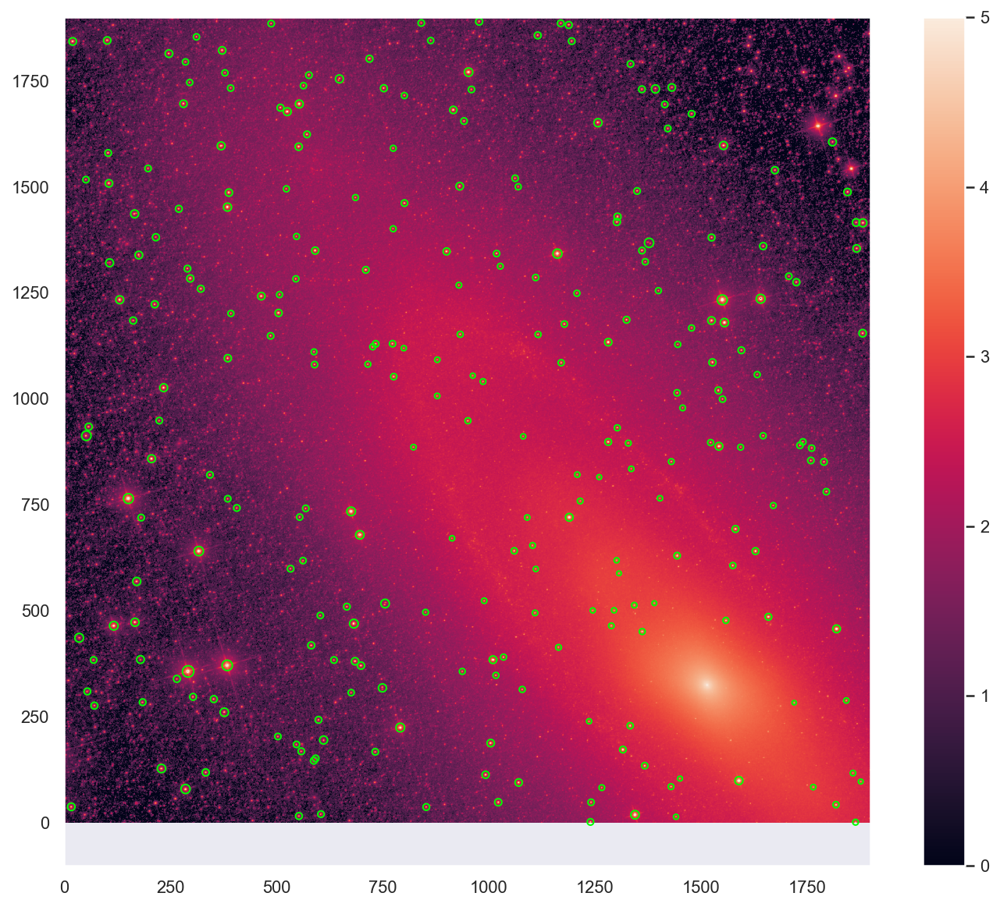

In [11]:
plt.imshow(np.log10(data), vmin=0, vmax=5, origin='lower')
plt.colorbar()
plt.scatter(objects_cut.x, objects_cut.y, color="None", edgecolor='#00FF00', s=10*objects_cut.a)

In [12]:
# now make a copy and convert pix coordinates back to original image pixels
df = objects_cut.copy()
df.loc[:,'x'] = objects_cut.x + x0
df.loc[:,'y'] = objects_cut.y + y0

In [13]:
# get more accurate centroids
xw, yw, _ = sep.winpos(data_orig, df.x, df.y, df.a)
# get more accurate radii
fluxrad, _ = sep.flux_radius(data_orig, xw, yw, 20*df.a, 0.99,
                             normflux=df.flux)
df = df.assign(xw=xw, yw=yw, fluxrad=2*fluxrad)

(1800, 3700)

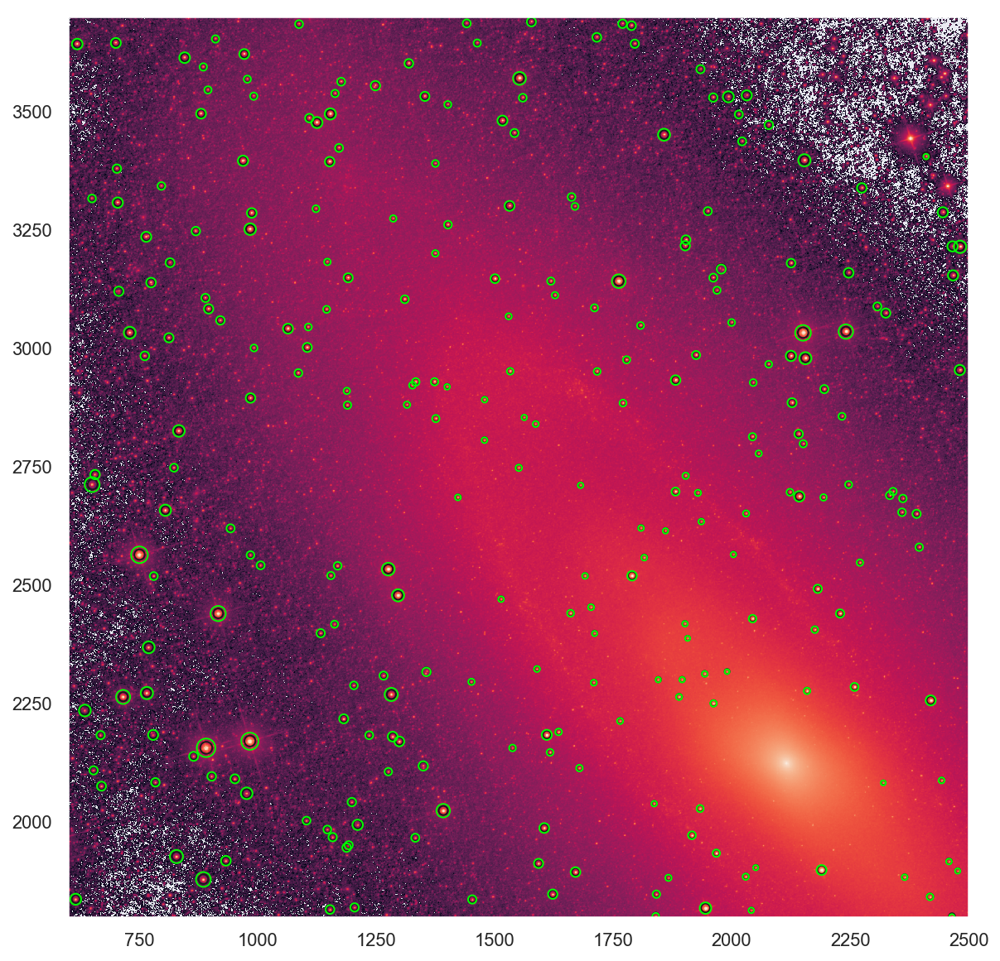

In [14]:
plt.imshow(np.log10(data_orig), vmin=0, vmax=5, origin='lower')
plt.scatter(df.x, df.y, color="None", edgecolor='k', s=10*df.a)
plt.scatter(df.xw, df.yw, color="None", edgecolor='#00FF00', s=3*df.fluxrad)
plt.xlim(x0,x1)
plt.ylim(y0,y1)

In [15]:
w = WCS('unwise-custom-0107p412-w1-img-m.fits')
ra, dec = w.all_pix2world(df[['xw','yw']].values, 0).T

pixel_scale = np.sqrt(np.sum(w.pixel_scale_matrix**2)/w.pixel_scale_matrix.shape[0])

df = df.assign(ra=ra, dec=dec, rad_deg=df.fluxrad*pixel_scale)

df[['ra','dec','rad_deg']].to_csv('M31_foreground.csv', index=False)